# Capstone Project - The Battle of the Neighborhoods
### Applied Data Science Capstone by IBM on Coursera  
## Investment of properties for short rent in Airbnb

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

## Introduction <a name="introduction"></a>

### Business Problem

Barcelona, Spain, is one of the most popular tourist destinations. According to Inside Airbnb [1], on 19th April 2019, there were 17899 properties listed in Airbnb website. _Accompany with tourist attraction data from Foursquare, I manage to obtain an insight, how to maximize properties profit by setting the optimized price._

[1] Inside Airbnb, http://insideairbnb.com/get-the-data.html, accessed on 27th May 2019)

### Data <a name="data"></a>

#### Airbnb data  
from http://insideairbnb.com/get-the-data.html (Barcelona, Catalonia, Spain). There are 
* listings.csv.gz
* calender.csv.gz
* reviews.csv.gz
* neighbourhoods.csv (Neighbourhood list for geo filter)
* neighbourhoods.geojson (GeoJSON file of neighbourhoods of the city).  

All files were obtained on 27th May 2019. All files were complied on 10 April 2019.

#### Nearby attractions 
The attractions details (such as name, location, type) are obtained by using **Foursquare API**.

#### Let's have a quick look in Airbnb data first

In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt

In [2]:
listing = pd.read_csv('listings 2.csv', low_memory=False)

In [3]:
print (listing.shape)
listing.head(5)

(17899, 106)


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,18666,https://www.airbnb.com/rooms/18666,20190410191814,2019-04-10,Flat with Sunny Terrace,"Apartment located near the ""Plaza de las Glori...",Nice apartment situated on the penthouse floor...,"Apartment located near the ""Plaza de las Glori...",none,Apartment in Barcelona near to the Plaza de la...,...,f,f,flexible,f,f,28,28,0,0,0.02
1,18674,https://www.airbnb.com/rooms/18674,20190410191814,2019-04-10,Huge flat for 8 people close to Sagrada Familia,110m2 apartment to rent in Barcelona. Located ...,Apartment with 110 m2 located in the 6th floor...,110m2 apartment to rent in Barcelona. Located ...,none,Apartment in Barcelona located in the heart of...,...,t,f,strict_14_with_grace_period,f,f,28,28,0,0,0.10
2,21605,https://www.airbnb.com/rooms/21605,20190410191814,2019-04-10,Nice and sunny duble room,"The flat is in Poblenou district, and the room...","L'apartament està al barri de Poblenou, i l'ha...","The flat is in Poblenou district, and the room...",none,Poblenou as one of the few areas that has grow...,...,f,f,moderate,f,f,2,0,2,0,3.01
3,23197,https://www.airbnb.com/rooms/23197,20190410191814,2019-04-10,FORUM DELUXE 5 MINS WALK CCIB CENTER & SEA!,"Beautiful apartment, large terrace, 5 min walk...",Elegant spacious apartment suitable for 6. Amp...,"Beautiful apartment, large terrace, 5 min walk...",none,Strategically located in the area of Parc del ...,...,t,f,strict_14_with_grace_period,f,t,2,2,0,0,0.36
4,25786,https://www.airbnb.com/rooms/25786,20190410191814,2019-04-10,NICE ROOM AVAILABLE IN THE HEART OF GRACIA,JUST GO THROUGH THE MANY REVIEWS I GOT THROUGH...,Room available for rent.- PEDRO PEREZ. Share...,JUST GO THROUGH THE MANY REVIEWS I GOT THROUGH...,none,Solo decir que a menudo ni salgo del barrio. M...,...,t,f,strict_14_with_grace_period,t,t,1,0,1,0,2.12


Listing has 106 columns, some of them is not need to be considered (e.g. url). Therefore, I only select some specific columns. Then, I will remove listing valiable from my notebook to clear memory.

In [4]:
list_used = listing.loc[:,['id', 'name','host_id', 'host_name', 'property_type','room_type','latitude', 'longitude',  \
                          'accommodates', 'bathrooms', 'bedrooms', 'beds', \
                          'square_feet','price', 'cleaning_fee', 'security_deposit', 'guests_included', 'extra_people', \
                          'minimum_nights_avg_ntm', 'availability_365', 'number_of_reviews', 'review_scores_value', \
                          'review_scores_location','reviews_per_month']]
print (list_used.shape)
list_used.head(3)

(17899, 24)


,id,name,host_id,host_name,property_type,room_type,latitude,longitude,accommodates,bathrooms,...,cleaning_fee,security_deposit,guests_included,extra_people,minimum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_value,review_scores_location,reviews_per_month
0,18666,Flat with Sunny Terrace,71615,Mireia And Maria,Apartment,Entire home/apt,41.40889,2.18555,6,1.0,...,$42.00,$150.00,2,$25.00,3.0,91,1,8.0,10.0,0.02
1,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia And Maria,Apartment,Entire home/apt,41.40420,2.17306,8,2.0,...,$50.00,$150.00,2,$30.00,3.7,219,7,8.0,9.0,0.10
2,21605,Nice and sunny duble room,82522,Meritxell,Apartment,Private room,41.40560,2.19821,2,1.0,...,NaN,$100.00,1,$10.00,2.8,254,107,9.0,9.0,3.01


Apart from unimportant columns (e.g. url, summary, space), I dorp some features such as bed_type, amenities. Because, this kind of information is hard to interpret. Weekly price , and Monthly price are alos excluded becuase the objective of the work only focus on short-stay.

In [5]:
del listing  # release memory

__Now__, the dataframe has only 24 columns (from 106). However, it has 17899 rows. This still too large. Let's apply a short rent criterion as minimum stay is less than or equal 3.

In [6]:
list_used.drop(list_used[list_used['minimum_nights_avg_ntm'] > 3].index, axis = 0, inplace = True)

In [7]:
print (list_used.shape)
list_used.head(3)

(12219, 24)


,id,name,host_id,host_name,property_type,room_type,latitude,longitude,accommodates,bathrooms,...,cleaning_fee,security_deposit,guests_included,extra_people,minimum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_value,review_scores_location,reviews_per_month
0,18666,Flat with Sunny Terrace,71615,Mireia And Maria,Apartment,Entire home/apt,41.40889,2.18555,6,1.0,...,$42.00,$150.00,2,$25.00,3.0,91,1,8.0,10.0,0.02
2,21605,Nice and sunny duble room,82522,Meritxell,Apartment,Private room,41.40560,2.19821,2,1.0,...,NaN,$100.00,1,$10.00,2.8,254,107,9.0,9.0,3.01
4,25786,NICE ROOM AVAILABLE IN THE HEART OF GRACIA,108310,Pedro,Apartment,Private room,41.40145,2.15645,2,1.0,...,NaN,NaN,1,$31.00,1.0,100,224,9.0,10.0,2.12


__Search for NaN is each column__

In [8]:
list_used.isna().sum()

id                            0
name                         15
host_id                       0
host_name                     4
property_type                 0
room_type                     0
latitude                      0
longitude                     0
accommodates                  0
bathrooms                     8
bedrooms                      3
beds                         33
square_feet               11847
price                         0
cleaning_fee               2710
security_deposit           3969
guests_included               0
extra_people                  0
minimum_nights_avg_ntm        0
availability_365              0
number_of_reviews             0
review_scores_value        2073
review_scores_location     2074
reviews_per_month          1938
dtype: int64

Here, the result shows that there are NaN in name (15), host_name (4), host_since (4), bath_rooms (8), bedrooms (3), beds (33), squrare_feet (11847), cleaning fee (2710), security_deposit (3969) and reviews. Therefore, the data need to be cleaned before doing the next step.

In [9]:
## I first drop square_feet as it has too manu NaN (11847 of 12219)
list_used.drop('square_feet', axis =1 , inplace = True)

In [10]:
## For cleaning_fee, security_deposit, and reviews_per_month, I fill NaN with 0.
list_used[['cleaning_fee', 'security_deposit', 'reviews_per_month']] = list_used[['cleaning_fee', 'security_deposit', 'reviews_per_month']].fillna(0)

## For bathrooms fill NaN with 1
list_used['bathrooms'] = list_used['bathrooms'].fillna(1)

## For name, host_name fill with 'No name', 'No hostname'
list_used['name'] = list_used['name'].fillna('No name')
list_used['host_name'] = list_used['host_name'].fillna('No hostname')

In [11]:
### check NaN in bedrooms
list_used[['bedrooms', 'beds']][list_used['bedrooms'].isna()==True]

,bedrooms,beds
1451,NaN,1.0
16728,NaN,1.0
17216,NaN,1.0


In [12]:
### let's use 'beds' for 'bedrooms'
list_used['bedrooms'] = list_used['bedrooms'].fillna(list_used['beds'])

In [13]:
## For 'beds' , fill NaN with 'bedrooms'
list_used['beds'] = list_used['beds'].fillna(list_used['bedrooms'])

In [14]:
## For review_scores_value, review_scores_location, fill NaN with mean
list_used[['review_scores_value', 'review_scores_location']] = list_used[['review_scores_value', 'review_scores_location']] \
                                        .fillna(list_used[['review_scores_value', 'review_scores_location']].mean())

In [15]:
### Check with NaN again
list_used.isna().sum().sum()

0

#### Now, there is no NaN exist in the dataframe.  
### Where are they in the map?

In [16]:
import json
import matplotlib.cm as cm
import matplotlib.colors as colors
import folium 

In [17]:
BC_loc = [41.38879, 2.15899]  ## Simply obtain from https://gps-coordinates.org/barcelona-latitude.php
# create map 
BC_map = folium.Map(location=BC_loc, zoom_start=13)

# add markers to map
for lat, lng in zip(list_used['latitude'], list_used['longitude']):
    folium.CircleMarker(
        [lat, lng],
        radius=1.5,
        color='blue',
        weight = 0.05,
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.3,
        parse_html=False).add_to(BC_map)  
    
BC_map

#### Have a quick look if a host list more than one properties.

In [18]:
df = list_used.groupby('host_id')['id'].count().reset_index()
df.rename({'id': 'count'},axis='columns', inplace = True)
df.sort_values(by='count',ascending=False, inplace = True)
df.head()

,host_id,count
4361,102947901,133
5243,158023606,111
196,1391607,94
2713,32037490,76
214,1447144,70


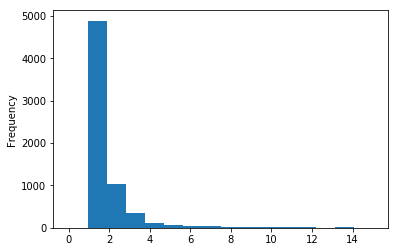

In [19]:
df['count'].plot(kind = 'hist', bins=16, range=(0,15))

In [20]:
df_count = df.groupby('count').count().reset_index()
df_count.rename({'count': 'number of listed properties', 'host_id' : 'number of host'},axis='columns', inplace = True)
df_count.head()

,number of listed properties,number of host
0,1,4889
1,2,1038
2,3,342
3,4,125
4,5,73


I narrow my objective down to consider the host that actually do business (i.e. lists more than 1 properties)

In [21]:
list_re = list_used
for i in df[df['count']==1]['host_id'] :
    list_re.drop(list_re[list_re['host_id'] == i].index, axis = 0, inplace = True)

In [22]:
print(list_re.shape)
list_re.head(5)

(7330, 23)


,id,name,host_id,host_name,property_type,room_type,latitude,longitude,accommodates,bathrooms,...,cleaning_fee,security_deposit,guests_included,extra_people,minimum_nights_avg_ntm,availability_365,number_of_reviews,review_scores_value,review_scores_location,reviews_per_month
0,18666,Flat with Sunny Terrace,71615,Mireia And Maria,Apartment,Entire home/apt,41.40889,2.18555,6,1.0,...,$42.00,$150.00,2,$25.00,3.0,91,1,8.0,10.0,0.02
2,21605,Nice and sunny duble room,82522,Meritxell,Apartment,Private room,41.40560,2.19821,2,1.0,...,0,$100.00,1,$10.00,2.8,254,107,9.0,9.0,3.01
5,31377,"Room for 2, Sagrada Famili",134698,Svetlana,Apartment,Private room,41.41097,2.17070,2,1.0,...,0,0,2,$5.00,3.0,178,4,9.0,9.0,0.08
6,31380,"Room for 2-3. Barcelona, Sagrada Famili",134698,Svetlana,Apartment,Private room,41.41090,2.17082,3,1.0,...,0,0,3,$10.00,3.0,188,39,9.0,8.0,0.84
7,31958,"Gaudi Attic 1, Friendly Rentals",136853,Fidelio,Apartment,Entire home/apt,41.40950,2.15938,4,1.0,...,$55.00,$200.00,4,$0.00,1.9,224,159,9.0,9.0,1.60


Now, we have 7330 properties. 

In [23]:
# create map 
BC_map_re = folium.Map(location=BC_loc, zoom_start=13)

# add markers to map
for lat, lng in zip(list_re['latitude'], list_re['longitude']):
    folium.CircleMarker(
        [lat, lng],
        radius=1.5,
        color='blue',
        weight = 0.05,
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.3,
        parse_html=False).add_to(BC_map_re)  
    
BC_map_re